In [3]:
import pandas as pd
import numpy as np
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
from collections import Counter
from collections import defaultdict
import itertools
from wordcloud import WordCloud
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from textblob import TextBlob

In [4]:
df = pd.read_csv("North_America-United_States.csv")

# Table of Contents
- Data Overview 
- Pre-Processing 
- Univariate Analysis 
- Data Cleaning
- Associate Actor and Top 5 Associate Actors Analysis 
	- Relation Between Actor 1 and Actor 2
	- BLM
	- Students
	- Labour Group 
	- Women
	- Government of United States
	- Map
- Year on Year analysis
	- 2020
	- 2021
	- 2022
- Per Section Analysis

## Data Overview

In [5]:
df.head()

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9383068,840,USA44621,44621,24 June 2022,2022,1,Protests,Excessive force against protesters,Protesters (United States),...,Cedar Rapids,41.9738,-91.6768,1,KCRG-TV9; Network Contagion Research Institute...,Local partner-National,"On 24 June 2022, 'pro-choice' protesters gathe...",0,1656458658,USA
1,9383099,840,USA44775,44775,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,Fayetteville,36.0626,-94.1574,1,Southwest Times Record; 40/29,Subnational,"On 24 June 2022, well over 100 people includin...",0,1656458658,USA
2,9383100,840,USA44783,44783,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,Eureka,40.8040,-124.1654,1,Lost Coast Outpost; North Coast Journal,Subnational,"On 24 June 2022, hundreds of people rallied ou...",0,1656458658,USA
3,9383101,840,USA44788,44788,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,West Hollywood,34.0900,-118.3617,1,CBS News; Liveuamap,Local partner-New media,"On 24 June 2022, hundreds of people rallied in...",0,1656458658,USA
4,9383102,840,USA44793,44793,24 June 2022,2022,1,Protests,Peaceful protest,Protesters (United States),...,Monterey,36.6031,-121.8936,1,Monterey County Herald; KSBW8,Subnational,"On 24 June 2022, hundreds of people rallied at...",0,1656458658,USA


In [6]:
df.shape

(42253, 31)

In [7]:
df.nunique()

data_id             42253
iso                     1
event_id_cnty       42253
event_id_no_cnty    42253
event_date            905
year                    3
time_precision          3
event_type              2
sub_event_type          5
actor1                  6
assoc_actor_1        5428
inter1                  2
actor2                 26
assoc_actor_2         310
inter2                  8
interaction            14
region                  1
country                 1
admin1                 51
admin2               1224
admin3                  0
location             4207
latitude             5134
longitude            5195
geo_precision           3
source              14344
source_scale           20
notes               42250
fatalities              4
timestamp             374
iso3                    1
dtype: int64

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 42253 entries, 0 to 42252
Data columns (total 31 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   data_id           42253 non-null  int64  
 1   iso               42253 non-null  int64  
 2   event_id_cnty     42253 non-null  object 
 3   event_id_no_cnty  42253 non-null  int64  
 4   event_date        42253 non-null  object 
 5   year              42253 non-null  int64  
 6   time_precision    42253 non-null  int64  
 7   event_type        42253 non-null  object 
 8   sub_event_type    42253 non-null  object 
 9   actor1            42253 non-null  object 
 10  assoc_actor_1     32392 non-null  object 
 11  inter1            42253 non-null  int64  
 12  actor2            3882 non-null   object 
 13  assoc_actor_2     1152 non-null   object 
 14  inter2            42253 non-null  int64  
 15  interaction       42253 non-null  int64  
 16  region            42253 non-null  object

- Converting the event_date to datetype format will help aid future analysis which can be broken down to years, months and days.

In [9]:
df.isnull().sum()

data_id                 0
iso                     0
event_id_cnty           0
event_id_no_cnty        0
event_date              0
year                    0
time_precision          0
event_type              0
sub_event_type          0
actor1                  0
assoc_actor_1        9861
inter1                  0
actor2              38371
assoc_actor_2       41101
inter2                  0
interaction             0
region                  0
country                 0
admin1                  0
admin2                 67
admin3              42253
location                0
latitude                0
longitude               0
geo_precision           0
source                  0
source_scale            0
notes                   0
fatalities              0
timestamp               0
iso3                    0
dtype: int64

Though there are considerable Null values in the assoc_actor_1, actor2 and assoc_actor_2. They can be used to provide interesting correlations later on to understand the cases where two actors are involved and the locations in which those took place.

## Pre-processing

as the entire column of admin3 is of no use and is entirely empty. We start by dropping that column

In [10]:
df.drop(columns=["admin3"], inplace=True)

From the overview we can see that, the date_type is of the type object and not date. Converting that to date type will be ideal.

In [11]:
df["event_date"] = pd.to_datetime(df["event_date"])

In [12]:
df.head()

,data_id,iso,event_id_cnty,event_id_no_cnty,event_date,year,time_precision,event_type,sub_event_type,actor1,...,location,latitude,longitude,geo_precision,source,source_scale,notes,fatalities,timestamp,iso3
0,9383068,840,USA44621,44621,2022-06-24,2022,1,Protests,Excessive force against protesters,Protesters (United States),...,Cedar Rapids,41.9738,-91.6768,1,KCRG-TV9; Network Contagion Research Institute...,Local partner-National,"On 24 June 2022, 'pro-choice' protesters gathe...",0,1656458658,USA
1,9383099,840,USA44775,44775,2022-06-24,2022,1,Protests,Peaceful protest,Protesters (United States),...,Fayetteville,36.0626,-94.1574,1,Southwest Times Record; 40/29,Subnational,"On 24 June 2022, well over 100 people includin...",0,1656458658,USA
2,9383100,840,USA44783,44783,2022-06-24,2022,1,Protests,Peaceful protest,Protesters (United States),...,Eureka,40.8040,-124.1654,1,Lost Coast Outpost; North Coast Journal,Subnational,"On 24 June 2022, hundreds of people rallied ou...",0,1656458658,USA
3,9383101,840,USA44788,44788,2022-06-24,2022,1,Protests,Peaceful protest,Protesters (United States),...,West Hollywood,34.0900,-118.3617,1,CBS News; Liveuamap,Local partner-New media,"On 24 June 2022, hundreds of people rallied in...",0,1656458658,USA
4,9383102,840,USA44793,44793,2022-06-24,2022,1,Protests,Peaceful protest,Protesters (United States),...,Monterey,36.6031,-121.8936,1,Monterey County Herald; KSBW8,Subnational,"On 24 June 2022, hundreds of people rallied at...",0,1656458658,USA


# Univariate Analysis

In [13]:
df['year'] = df['event_date'].dt.year.astype(str)
yearly_counts = df['year'].value_counts().reset_index()
yearly_counts.columns = ['year', 'count']

fig = px.pie(yearly_counts, names="year", values="count", title="Number of Protests per Year")
fig.show()

- Most of the data in the dataset as we can see from the above pie chart comes from 2020. We can further delve deep into understanding:
    - Why majority of it is from 2020
    - What could be contributing to it

In [84]:
df['year_month'] = df['event_date'].dt.strftime('%Y-%m')

monthly_protest_counts = df.groupby('year_month').size().reset_index(name='protest_count')


fig = px.bar(monthly_protest_counts, x='year_month', y='protest_count',
             title='Monthly Protest Count Per Year',
             labels={'year_month': 'Year-Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

From the previous plot we have observed that majority of the data comes from 2020. This bar corroborates that idea.

Top 5 number of protests that occured across 2020 - 2022 came during the months May - Sept of 2020.

In [15]:
event_counts = df['event_type'].value_counts().reset_index()
event_counts.columns = ['event_type', 'count']

fig = px.pie(event_counts, names="event_type", values="count", title="Count of Event types")
fig.show()

- We can see that overall protests have been higher compared to riots. So by definition of the data, there has been less violent outbreaks. It will be interesting to see the breakup for specific groups.

In [16]:
sub_event_counts = df['sub_event_type'].value_counts().reset_index()
sub_event_counts.columns = ['sub_event_type', 'count']

fig = px.pie(sub_event_counts, names="sub_event_type", values="count",hole = 0.3, title="Count of Sub Event types")
fig.update_xaxes(tickangle=-90)

fig.show()

In line with the previous graph, we can see that most of the Sub events are Peaceful Protests. This also explains the majority of it being protests.

In [79]:
actor1_counts = df['actor1'].value_counts().reset_index()
actor1_counts.columns = ['actor1', 'count']

fig = px.bar(actor1_counts, x="actor1", y="count", title="Count of Actor1")
fig.update_xaxes(tickangle=-45)
fig.show()

- Compared to United States the we can see that the information at our disposal regarding Protests and Riots outside of the United States is limited. In this scenario as the data is very skewed it might not give an accurate representation of the international data. Those should be dealt with while continuing the analysis.

In [82]:
assoc_actors = df['assoc_actor_1'].dropna().tolist()

assoc_actors_cleaned = []
for actor in assoc_actors:
    if ';' in actor:
        assoc_actors_cleaned.extend(actor.split(';'))
    else:
        assoc_actors_cleaned.append(actor)

assoc_actors_cleaned = [actor.strip() for actor in assoc_actors_cleaned]

assoc_actor_counts = Counter(assoc_actors_cleaned)

sorted_actors = sorted(assoc_actor_counts, key=assoc_actor_counts.get, reverse=True)

top_50_actors = sorted_actors[:50]
top_50_df = pd.DataFrame.from_dict({actor: assoc_actor_counts[actor] for actor in top_50_actors}, orient='index', columns=['Count']).reset_index()
top_50_df.rename(columns={'index': 'Actor'}, inplace=True)
#fig.update_xaxes(tickangle=45)

fig = px.bar(top_50_df, x='Actor', y='Count', title='Top 50 Associated Actors')
fig.show()

- Seeing the Top 50 gives a very broad and unimportant overview of the entire feature. By zooming in to the top 5, it can provide a snapshot into the analysis as they do explain a large chunk of the Associated actors. And the Top 5 seem to be:

(BLM: Black Lives Matter, Students, Labour Group, Women, Government of the United States, African American Group)

In [19]:
actor2_counts = df['actor2'].value_counts().reset_index()
actor2_counts.columns = ['actor2', 'count']

fig = px.bar(actor2_counts, x="actor2", y="count", title="Count of Actor2")
fig.update_xaxes(tickangle=-45)
fig.show()

- As we saw for Actor1, it is the same case here where most of the data is skewed by the United States and the rest are very less. This can also be dealt with accoringly.

In [85]:
assoc_actors_2 = df['assoc_actor_2'].dropna().tolist()

assoc_actors_2_cleaned = []
for actor in assoc_actors_2:
    if ';' in actor:
        assoc_actors_2_cleaned.extend(actor.split(';'))
    else:
        assoc_actors_2_cleaned.append(actor)

assoc_actors_2_cleaned = [actor.strip() for actor in assoc_actors_2_cleaned]

assoc_actor2_counts = Counter(assoc_actors_2_cleaned)

sorted_actors_2 = sorted(assoc_actor2_counts, key=assoc_actor2_counts.get, reverse=True)

top_50_actors = sorted_actors_2[:50]
top_50_df = pd.DataFrame.from_dict({actor: assoc_actor2_counts[actor] for actor in top_50_actors}, orient='index', columns=['Count']).reset_index()
top_50_df.rename(columns={'index': 'Actor'}, inplace=True)

fig = px.bar(top_50_df, x='Actor', y='Count', title='Top 50 Associated Actors 2')
fig.update_xaxes(tickangle=-45)
fig.show()

By Analyzing the Actor1; Assoc Actor 1 - Actor 2; Assoc Actor2. We can try to determine some interesting insights into their relation.

In [21]:
interaction_counts = df['interaction'].value_counts().reset_index()
interaction_counts.columns = ['interaction', 'count']

fig = px.pie(interaction_counts, names="interaction", values="count",hole = 0.3, title="Count of Protests per interaction")
fig.update_xaxes(tickangle=-90)
fig.show()

- At this stage this is fairly unimportant as we do not have more information on the codes and their meaning and as 90% + are skewed in favour of the Interaction code 60 - We can avoid this for analysis.

In [86]:
admin1_counts = df['admin1'].value_counts().reset_index()
admin1_counts.columns = ['admin1', 'count']

fig = px.bar(admin1_counts, x="admin1", y="count", title="Count of Admin1")
fig.update_xaxes(tickangle=-45)
fig.show()

- Here we can see that most of the States in questions are the states with large cities with large population. Most of the population centers in the United States and modern working public are located here, it makes sense that the top 10 here would be ideally the top 10 most populated and popular states in the Untied States.

- It might be an interesting correaltion to see the event sub_type to the state.

In [87]:
admin2_counts = df['admin2'].value_counts().reset_index()
admin2_counts.columns = ['admin2', 'count']

top50_admin2_counts = admin2_counts.head(50)

fig = px.bar(top50_admin2_counts, x="admin2", y="count", title="Top 50 Count of Admin2")
fig.update_xaxes(tickangle=-45)
fig.show()

In [88]:
location_counts = df['location'].value_counts().reset_index()
location_counts.columns = ['location', 'count']

top50_location_counts = location_counts.head(50)

fig = px.bar(top50_location_counts, x="location", y="count", title="Top 50 Count of location")
fig.update_xaxes(tickangle=-45)
fig.show()

In [89]:
sources = df['source'].dropna().tolist()

sources_cleaned = []
for actor in sources:
    if ';' in actor:
        sources_cleaned.extend(actor.split(';'))
    else:
        sources_cleaned.append(actor)

sources_cleaned = [actor.strip() for actor in sources_cleaned]

sources_counts = Counter(sources_cleaned)

sorted_sources = sorted(sources_counts, key=sources_counts.get, reverse=True)

top_50_actors = sorted_sources[:50]
top_50_df = pd.DataFrame.from_dict({actor: sources_counts[actor] for actor in top_50_actors}, orient='index', columns=['Count']).reset_index()
top_50_df.rename(columns={'index': 'Sources'}, inplace=True)

fig = px.bar(top_50_df, x='Sources', y='Count', title='Top 50 Associated Sources')
fig.update_xaxes(tickangle=-45)
fig.show()

- Majority of the information is sourced from Three sources:
  - Crowd Counting Consortium
  - Count Love
  - Twitter

- Not a lot of the data has been gathered from traditional media channels, this can speak to the quality of the data and the non legacy channel access to data available in this day and age.

In [90]:
source_scale_counts = df['source_scale'].value_counts().reset_index()
source_scale_counts.columns = ['source_scale', 'count']

top50_source_scale_counts = source_scale_counts.head(50)

fig = px.bar(top50_source_scale_counts, x="source_scale", y="count", title="Top 50 Count of source_scale")
fig.update_xaxes(tickangle=-45)
fig.show()

# Data Cleaning

Based on the univariate analysis done, we are focusing on the United States as that is a majority.

In [27]:
df = df[df['actor1'].str.contains('United States', case=False)]
df.shape

(42238, 31)

In [28]:
df.describe()

,data_id,iso,event_id_no_cnty,event_date,time_precision,inter1,inter2,interaction,latitude,longitude,geo_precision,fatalities,timestamp
count,4.223800e+04,42238.0,42238.000000,42238,42238.000000,42238.000000,42238.000000,42238.000000,42238.000000,42238.000000,42238.000000,42238.000000,4.223800e+04
mean,8.266746e+06,840.0,22430.918959,2021-02-01 18:58:12.779014144,1.005422,5.974620,0.330177,58.229627,38.370137,-92.543588,1.007955,0.000710,1.627587e+09
min,7.593655e+06,840.0,1.000000,2020-01-01 00:00:00,1.000000,5.000000,0.000000,15.000000,19.442700,-166.534100,1.000000,0.000000,1.612546e+09
25%,7.616716e+06,840.0,11024.250000,2020-06-20 00:00:00,1.000000,6.000000,0.000000,60.000000,34.799800,-106.651100,1.000000,0.000000,1.612547e+09
50%,8.265290e+06,840.0,22444.500000,2020-11-17 00:00:00,1.000000,6.000000,0.000000,60.000000,39.219100,-86.443600,1.000000,0.000000,1.624483e+09
75%,8.680164e+06,840.0,33741.750000,2021-08-18 00:00:00,1.000000,6.000000,0.000000,60.000000,41.850000,-77.615500,1.000000,0.000000,1.638920e+09
max,9.383708e+06,840.0,45052.000000,2022-06-24 00:00:00,3.000000,6.000000,8.000000,68.000000,71.290600,-67.461400,3.000000,3.000000,1.656459e+09
std,5.543203e+05,0.0,13078.246226,NaN,0.074075,0.157278,1.280650,9.161994,5.195800,18.214649,0.097962,0.030766,1.388826e+07


Dropped the admin3 column and converted the appropriate data types as seen above

# Associate Actor and top 5 associate Actors Analysis

## Relation between Actor 1 and Actor 2

In [29]:
pair_freq = defaultdict(int)

for _, row in df.dropna(subset=['assoc_actor_1', 'assoc_actor_2']).iterrows():

    actors_1 = [actor.strip() for actor in row['assoc_actor_1'].split(';')]
    actors_2 = [actor.strip() for actor in row['assoc_actor_2'].split(';')]

    for actor_1, actor_2 in itertools.product(actors_1, actors_2):
        pair_freq[(actor_1, actor_2)] += 1

pair_freq_df = pd.DataFrame(list(pair_freq.items()), columns=['Actor Pair', 'Frequency'])

pair_freq_df_sorted = pair_freq_df.sort_values(by='Frequency', ascending=False).reset_index(drop=True)

pair_freq_df_sorted.head(10)

,Actor Pair,Frequency
0,"(BLM: Black Lives Matter, Pro-Police Group (Un...",173
1,"(Pro-Police Group (United States), BLM: Black ...",105
2,"(Back the Blue, BLM: Black Lives Matter)",60
3,"(BLM: Black Lives Matter, Back the Blue)",53
4,"(BLM: Black Lives Matter, Civilians (United St...",38
5,"(Proud Boys, Antifa (United States))",36
6,"(Students (United States), Students (United St...",35
7,"(Women (United States), Students (United States))",31
8,"(Women (United States), Christian Group (Unite...",30
9,"(BLM: Black Lives Matter, Journalists (United ...",30


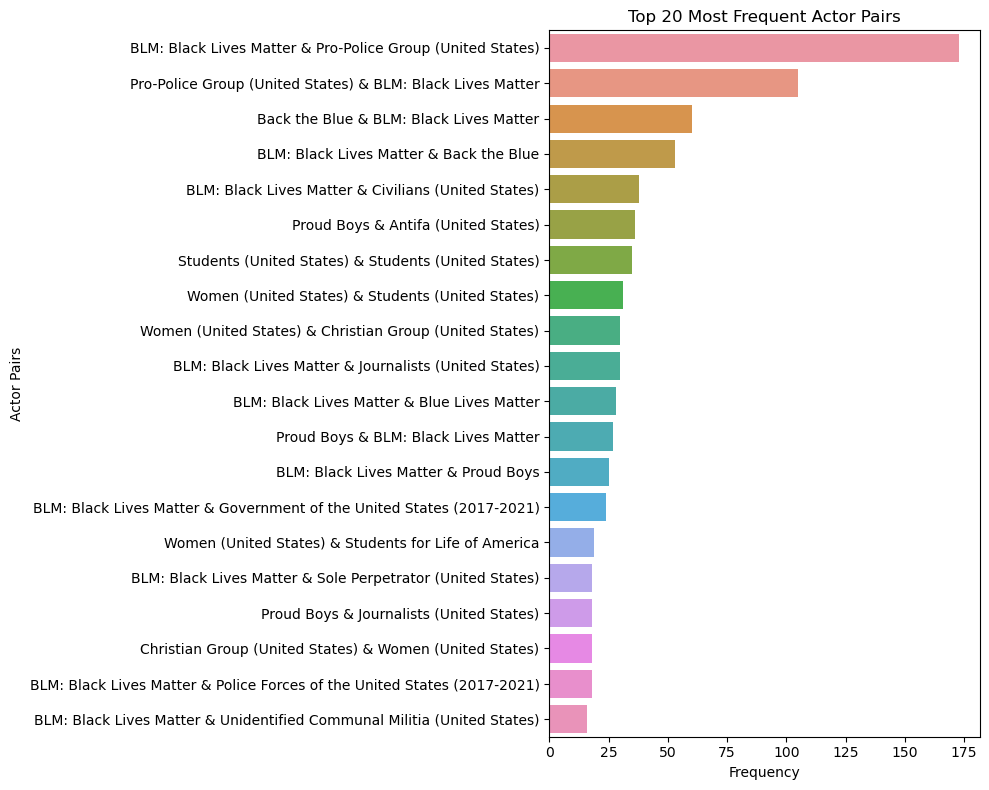

In [30]:
pair_freq_df_sorted['Actor Pair Str'] = pair_freq_df_sorted['Actor Pair'].apply(lambda x: f"{x[0]} & {x[1]}")
# As the values are stored in pairs, using the lamda function we are splitting
# them and spearating the Pairs using an & for understanding.

plt.figure(figsize=(10, 8))
sns.barplot(x='Frequency', y='Actor Pair Str', data=pair_freq_df_sorted.head(20))
plt.title('Top 20 Most Frequent Actor Pairs')
plt.xlabel('Frequency')
plt.ylabel('Actor Pairs')
plt.tight_layout()
plt.show()

In [31]:
df['interaction'] = df['interaction'].astype(str)
interaction_counts = df['interaction'].value_counts().reset_index()
interaction_counts.columns = ['interaction', 'count']
interaction_counts = interaction_counts[1:]

fig = px.pie(interaction_counts, names="interaction", values="count", title="Count of protests per interaction code")
fig.show()

- 66 - PROTESTERS VERSUS PROTESTERS (e.g. two-sided peaceful protest)
- 16 - STATE FORCES VERSUS PROTESTERS (e.g. suppression of a peaceful demonstration by police or military)
- 15 - STATE FORCES VERSUS RIOTERS (e.g. suppression of a violent demonstration by police or military)
- 50 - SOLE RIOTER ACTION (e.g. one-sided violent demonstration; spontaneous arson)
- 36 - POLITICAL MILITIA VERSUS PROTESTERS (e.g. suppression of a peaceful demonstration by a political militia)
- 57 - RIOTERS VERSUS CIVILIANS (e.g. violent demonstration in which civilians are injured/killed; spontaneous violence in which civilians are targeted by a mob)

## BLM

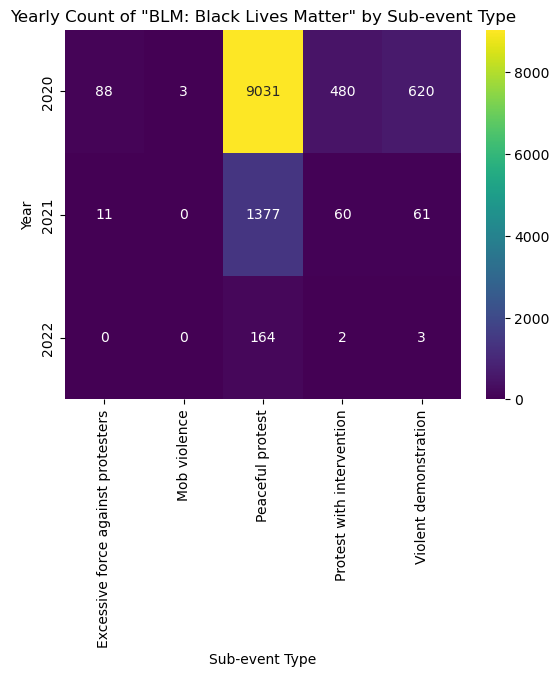

In [32]:
blm_data = df[df['assoc_actor_1'].str.contains('BLM: Black Lives Matter', na=False)]
#Isolating all the rows with the mention of BLM in the associated actor

yearly_sub_event_counts = blm_data.groupby([blm_data['event_date'].dt.year, 'sub_event_type']).size().unstack(fill_value=0)

sns.heatmap(yearly_sub_event_counts, cmap='viridis', annot=True, fmt='d')
plt.title('Yearly Count of "BLM: Black Lives Matter" by Sub-event Type')
plt.xlabel('Sub-event Type')
plt.ylabel('Year')
plt.show()

- We can see that majority of the Protests by the BLM have been peaceful protests although not entirely. There are also not so insiginificant instances of Force being used.

- The impact of the movement in the year 2020 was incredibly high as that can be seen, but the mobilization of the movement did not sustain over the next two years. As we can see from the graph the number from this movement decreasedover the next two years.

- BLM is the largeest contributor to the events in 2020 thus explaining the huge spike that we previously observed.

In [33]:
blm_data.columns

Index(['data_id', 'iso', 'event_id_cnty', 'event_id_no_cnty', 'event_date',
       'year', 'time_precision', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'region', 'country', 'admin1', 'admin2', 'location',
       'latitude', 'longitude', 'geo_precision', 'source', 'source_scale',
       'notes', 'fatalities', 'timestamp', 'iso3', 'year_month'],
      dtype='object')

In [34]:
blm_data['year_month'] = blm_data['event_date'].dt.strftime('%Y-%m')
#creating a year-month for ease of analysis from the converted event_date

monthly_protest_counts = blm_data.groupby(['year_month','admin1']).size().reset_index(name='protest_count')
#per month protest counts coloured by admin1 to check for a possible correlation

fig = px.bar(monthly_protest_counts, x='admin1', y='protest_count', color = 'year_month',
             title='BLM State Wise Protest Count Per Year_Month',
             labels={'year_month': 'Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\3871097022.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\2395244002.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



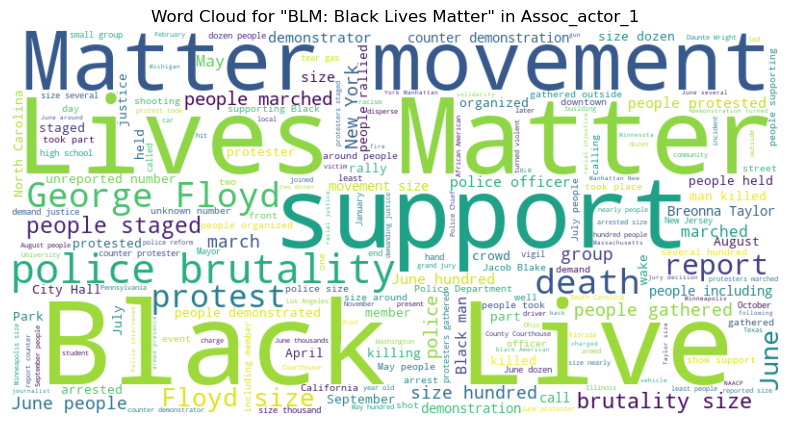

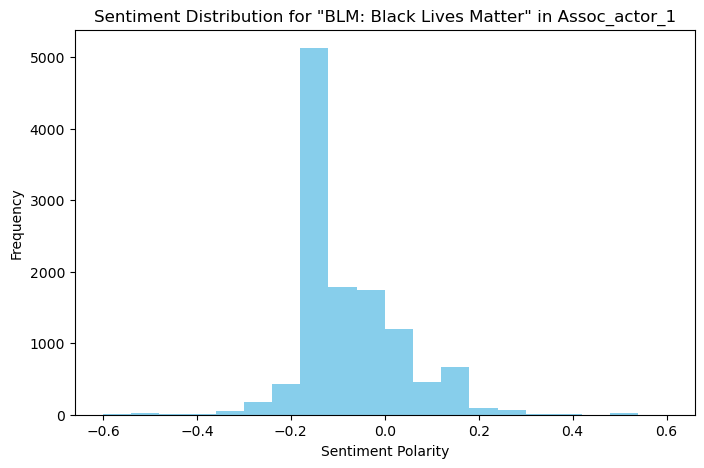

In [35]:
def analyze_sentiment(text):
    return TextBlob(text).sentiment.polarity
    
blm_data = df[df['assoc_actor_1'].str.contains('BLM: Black Lives Matter', na=False) & df['notes'].notna()]

blm_data['sentiment'] = blm_data['notes'].apply(analyze_sentiment)

wordcloud_text = ' '.join(blm_data['notes'])

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(wordcloud_text)
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for "BLM: Black Lives Matter" in Assoc_actor_1')
plt.show()

plt.figure(figsize=(8, 5))
plt.hist(blm_data['sentiment'], bins=20, color='skyblue')
plt.title('Sentiment Distribution for "BLM: Black Lives Matter" in Assoc_actor_1')
plt.xlabel('Sentiment Polarity')
plt.ylabel('Frequency')
plt.show()

Doing a simple wordcloud shows us that in accordance with the data in 2020. Most of the protests and riots were revolving predominantly around Black Lives Matter

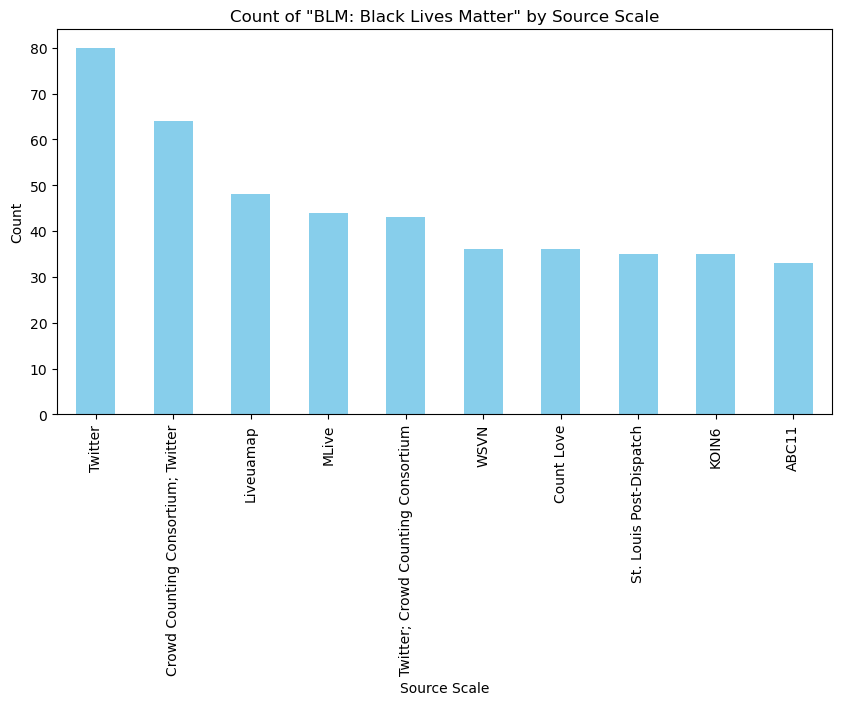

In [36]:
blm_source_counts = blm_data['source'].value_counts() #Getting the counts of the sources
blm_source_10 = blm_source_counts[:10] #As there are many sources, looking here at the top 10

plt.figure(figsize=(10, 5))
blm_source_10.plot(kind='bar', color='skyblue')
plt.title('Count of "BLM: Black Lives Matter" by Source Scale')
plt.xlabel('Source Scale')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

- As we saw earlier and it can be corroborated here, most of the information has come from non legacy media such as Twitter, Crowd Counting Consortium and Liveuamap.

In [37]:
fig = px.scatter_mapbox(blm_data, lat="latitude", lon="longitude", hover_name="location", zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Map of "BLM: Black Lives Matter" Instances', margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

- As evidenced previously most of the protests are clustered to the east cost and the west coast. Most of the recorded protests have been in the majorly populated areas.

## Students

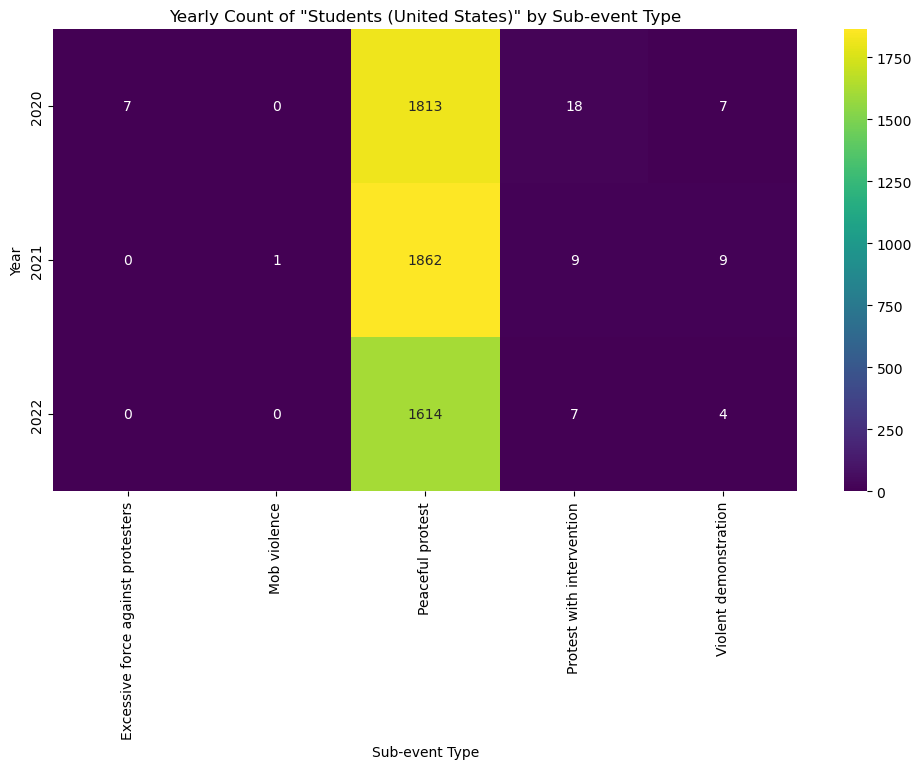

In [38]:
students_data = df[df['assoc_actor_1'].str.contains('Students', na=False)]

yearly_sub_event_counts = students_data.groupby([students_data['event_date'].dt.year, 'sub_event_type']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 6))
sns.heatmap(yearly_sub_event_counts, cmap='viridis', annot=True, fmt='d')
plt.title('Yearly Count of "Students (United States)" by Sub-event Type')
plt.xlabel('Sub-event Type')
plt.ylabel('Year')
plt.show()

In [39]:
students_data.columns

Index(['data_id', 'iso', 'event_id_cnty', 'event_id_no_cnty', 'event_date',
       'year', 'time_precision', 'event_type', 'sub_event_type', 'actor1',
       'assoc_actor_1', 'inter1', 'actor2', 'assoc_actor_2', 'inter2',
       'interaction', 'region', 'country', 'admin1', 'admin2', 'location',
       'latitude', 'longitude', 'geo_precision', 'source', 'source_scale',
       'notes', 'fatalities', 'timestamp', 'iso3', 'year_month'],
      dtype='object')

In [40]:
students_data['month'] = students_data['event_date'].dt.strftime('%m')

monthly_protest_counts = students_data.groupby(['month','admin1']).size().reset_index(name='protest_count')

fig = px.bar(monthly_protest_counts, x='admin1', y='protest_count', color = 'month',
             title='students Monthly Protest Count Per Year',
             labels={'year_month': 'Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\3831895891.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



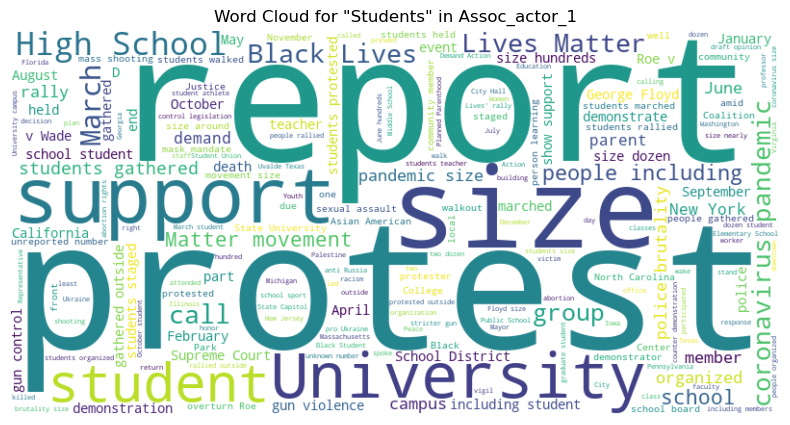

In [41]:
students_notes = ' '.join(df[df['assoc_actor_1'].str.contains('Students', na=False)]['notes'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(students_notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for "Students" in Assoc_actor_1')
plt.show()

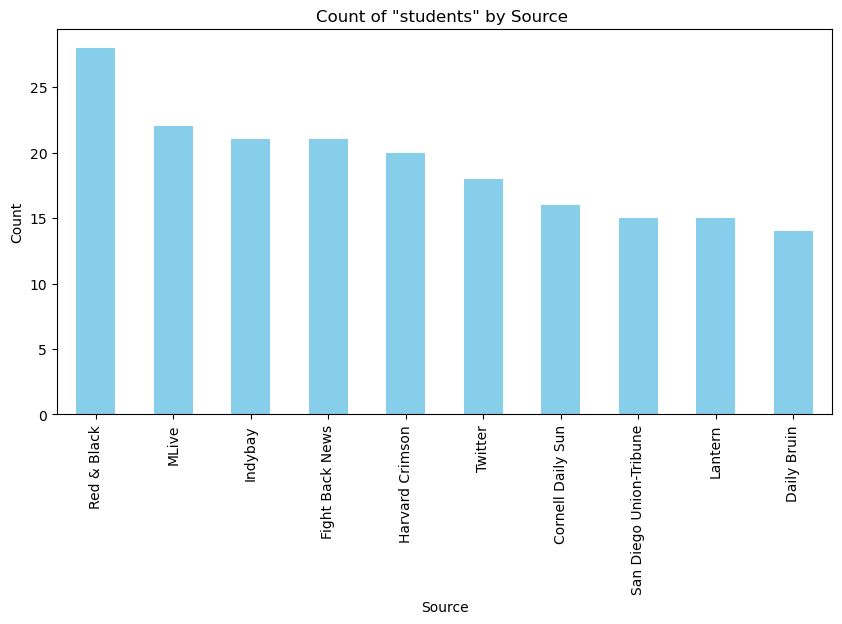

In [42]:
students_source_counts = students_data['source'].value_counts()
students_source_10 = students_source_counts[:10]

plt.figure(figsize=(10, 5))
students_source_10.plot(kind='bar', color='skyblue')
plt.title('Count of "students" by Source ')
plt.xlabel('Source')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [43]:
fig = px.scatter_mapbox(students_data, lat="latitude", lon="longitude", hover_name="location", zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Map of "students" Instances', margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

## Labour Group

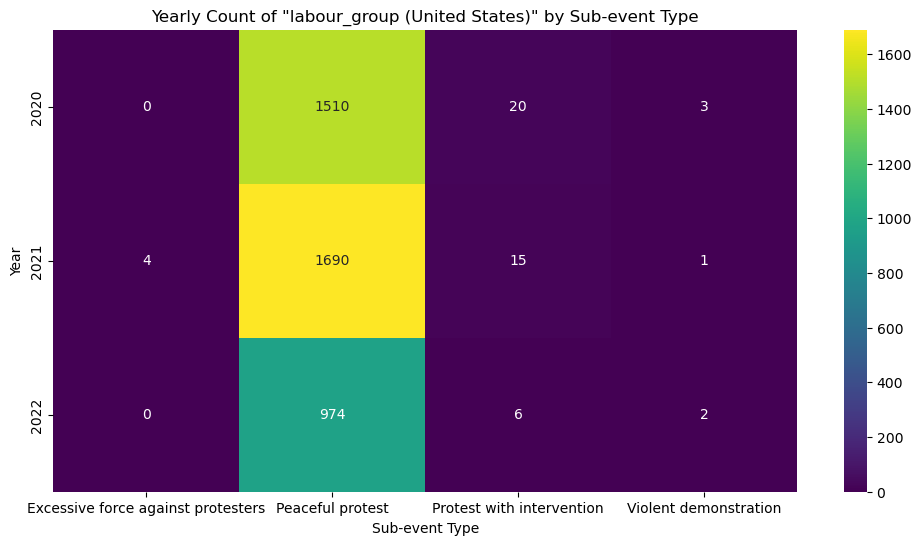

In [44]:
labour_group_data = df[df['assoc_actor_1'].str.contains('Labour Group', na=False)]

yearly_sub_event_counts = labour_group_data.groupby([labour_group_data['event_date'].dt.year, 'sub_event_type']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 6))
sns.heatmap(yearly_sub_event_counts, cmap='viridis', annot=True, fmt='d')
plt.title('Yearly Count of "labour_group (United States)" by Sub-event Type')
plt.xlabel('Sub-event Type')
plt.ylabel('Year')
plt.show()

In [45]:
labour_group_data['month'] = labour_group_data['event_date'].dt.strftime('%m')

monthly_protest_counts = labour_group_data.groupby(['month','admin1']).size().reset_index(name='protest_count')

fig = px.bar(monthly_protest_counts, x='admin1', y='protest_count', color = 'month',
             title='labour_group Monthly Protest Count Per Year',
             labels={'year_month': 'Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\3227680976.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



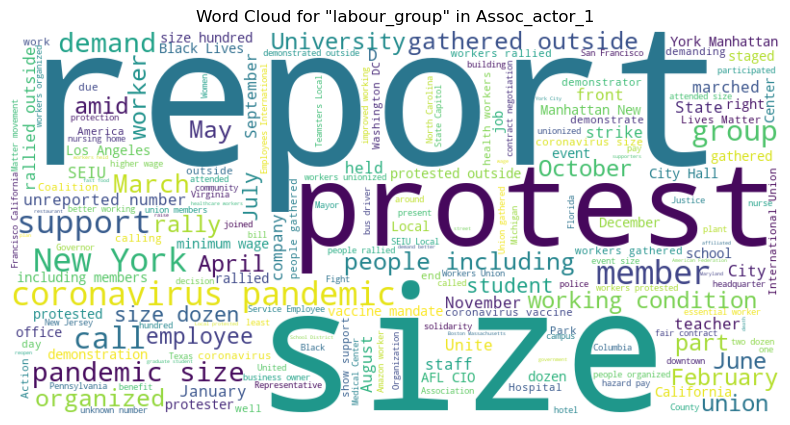

In [46]:
labour_group_notes = ' '.join(df[df['assoc_actor_1'].str.contains('Labour Group', na=False)]['notes'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(labour_group_notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for "labour_group" in Assoc_actor_1')
plt.show()

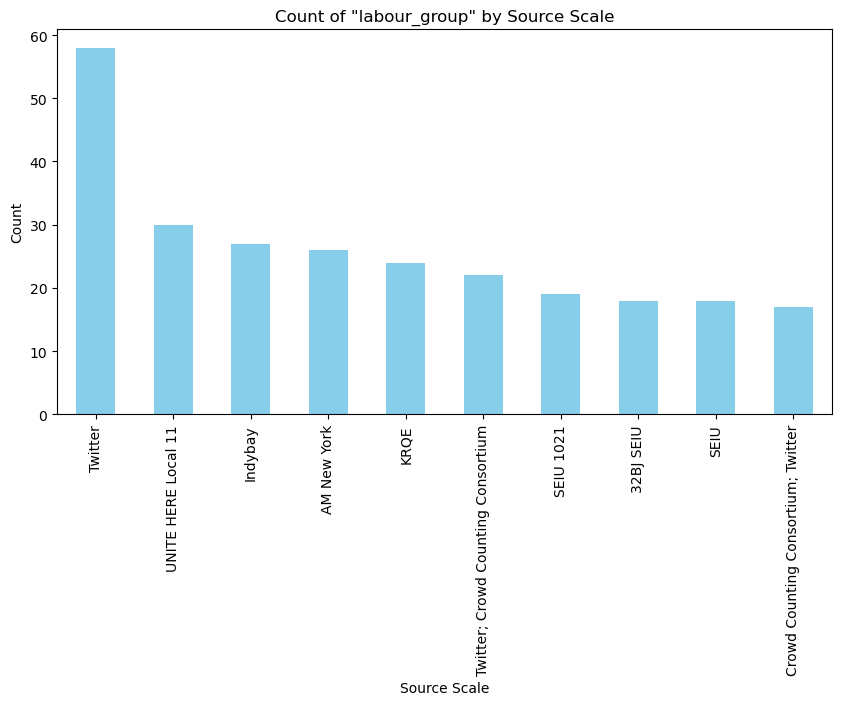

In [47]:
labour_group_source_counts = labour_group_data['source'].value_counts()
labour_group_source_10 = labour_group_source_counts[:10]

plt.figure(figsize=(10, 5))
labour_group_source_10.plot(kind='bar', color='skyblue')
plt.title('Count of "labour_group" by Source Scale')
plt.xlabel('Source Scale')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [48]:
fig = px.scatter_mapbox(labour_group_data, lat="latitude", lon="longitude", hover_name="location", zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Map of "Labour Group" Instances', margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

## Women

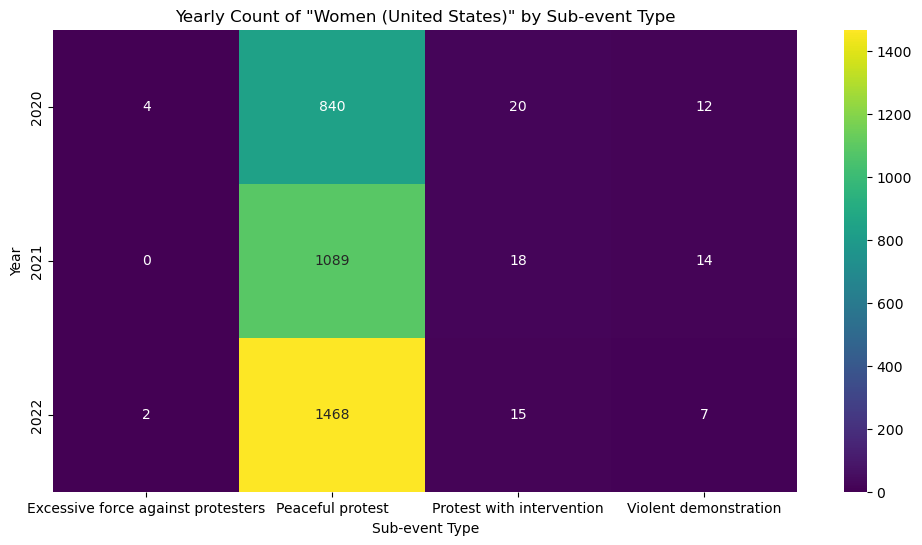

In [49]:
women_data = df[df['assoc_actor_1'].str.contains('Women', na=False)]

yearly_sub_event_counts = women_data.groupby([women_data['event_date'].dt.year, 'sub_event_type']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 6))
sns.heatmap(yearly_sub_event_counts, cmap='viridis', annot=True, fmt='d')
plt.title('Yearly Count of "Women (United States)" by Sub-event Type')
plt.xlabel('Sub-event Type')
plt.ylabel('Year')
plt.show()

In [50]:
women_data['month'] = women_data['event_date'].dt.strftime('%m')

monthly_protest_counts = women_data.groupby(['month','admin1']).size().reset_index(name='protest_count')

fig = px.bar(monthly_protest_counts, x='admin1', y='protest_count', color = 'month',
             title='women Monthly Protest Count Per Year',
             labels={'year_month': 'Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\3970196015.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



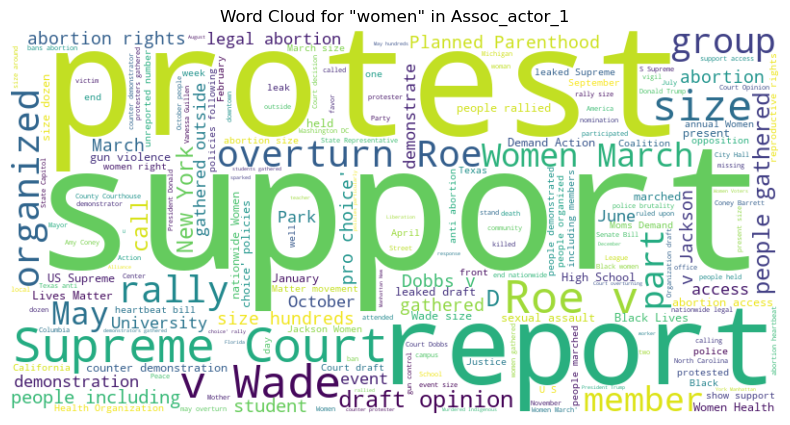

In [51]:
women_notes = ' '.join(df[df['assoc_actor_1'].str.contains('Women', na=False)]['notes'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(women_notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for "women" in Assoc_actor_1')
plt.show()

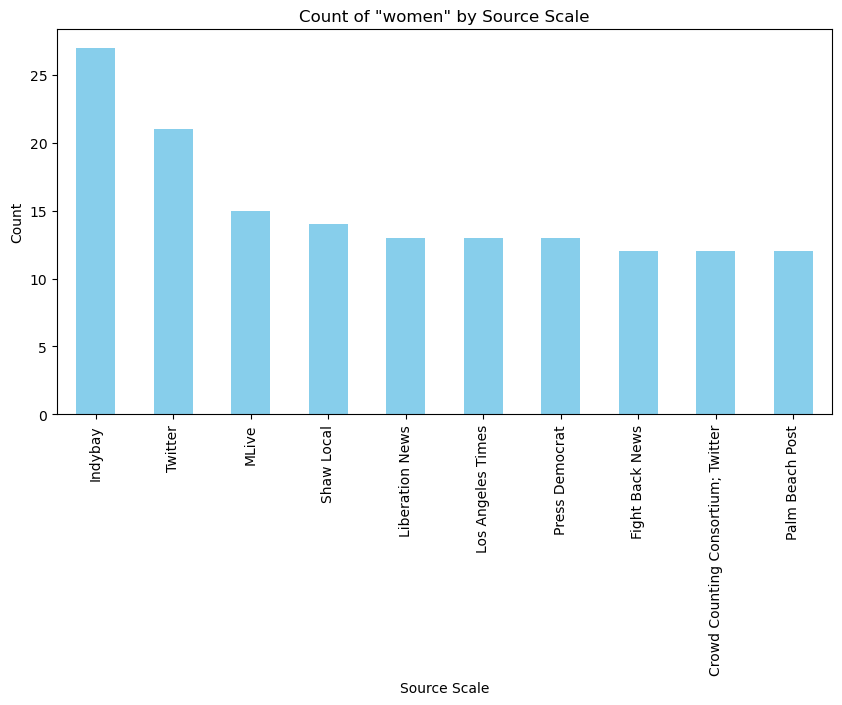

In [52]:
women_source_counts = women_data['source'].value_counts()
women_source_count_10 = women_source_counts[:10]

plt.figure(figsize=(10, 5))
women_source_count_10.plot(kind='bar', color='skyblue')
plt.title('Count of "women" by Source Scale')
plt.xlabel('Source Scale')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [53]:
fig = px.scatter_mapbox(women_data, lat="latitude", lon="longitude", hover_name="location", zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Map of "Woman" Instances', margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

## Government of United States

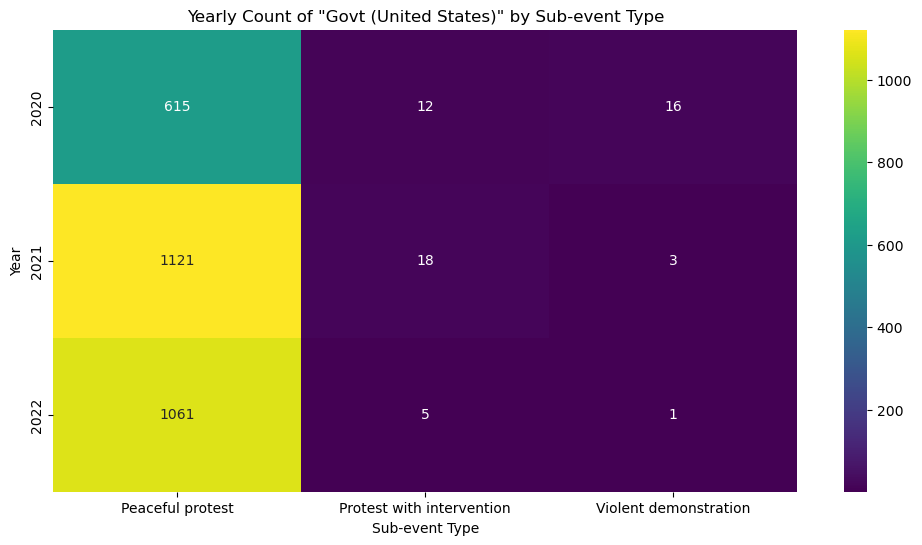

In [54]:
govt_data = df[df['assoc_actor_1'].str.contains('Government of the United States', na=False)]

yearly_sub_event_counts = govt_data.groupby([govt_data['event_date'].dt.year, 'sub_event_type']).size().unstack(fill_value=0)

plt.figure(figsize=(12, 6))
sns.heatmap(yearly_sub_event_counts, cmap='viridis', annot=True, fmt='d')
plt.title('Yearly Count of "Govt (United States)" by Sub-event Type')
plt.xlabel('Sub-event Type')
plt.ylabel('Year')
plt.show()

In [55]:
govt_data['month'] = govt_data['event_date'].dt.strftime('%m')

monthly_protest_counts = govt_data.groupby(['month','admin1']).size().reset_index(name='protest_count')

fig = px.bar(monthly_protest_counts, x='admin1', y='protest_count', color = 'month',
             title='govt Monthly Protest Count Per Year',
             labels={'year_month': 'Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\2211750188.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



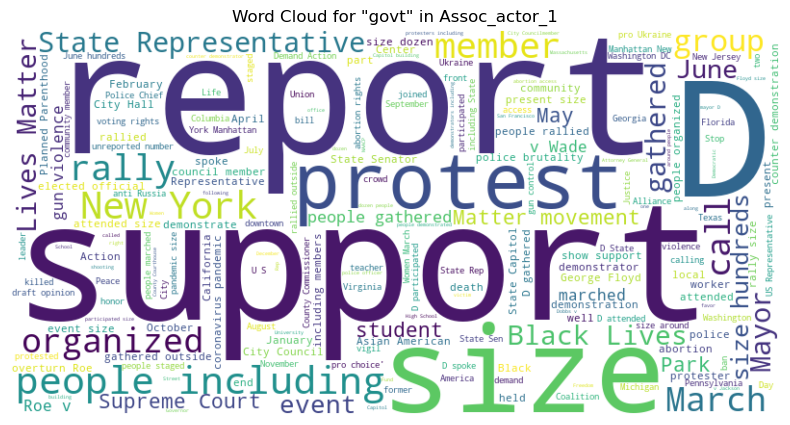

In [56]:
govt_notes = ' '.join(df[df['assoc_actor_1'].str.contains('Government of the United States', na=False)]['notes'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color='white').generate(govt_notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud for "govt" in Assoc_actor_1')
plt.show()

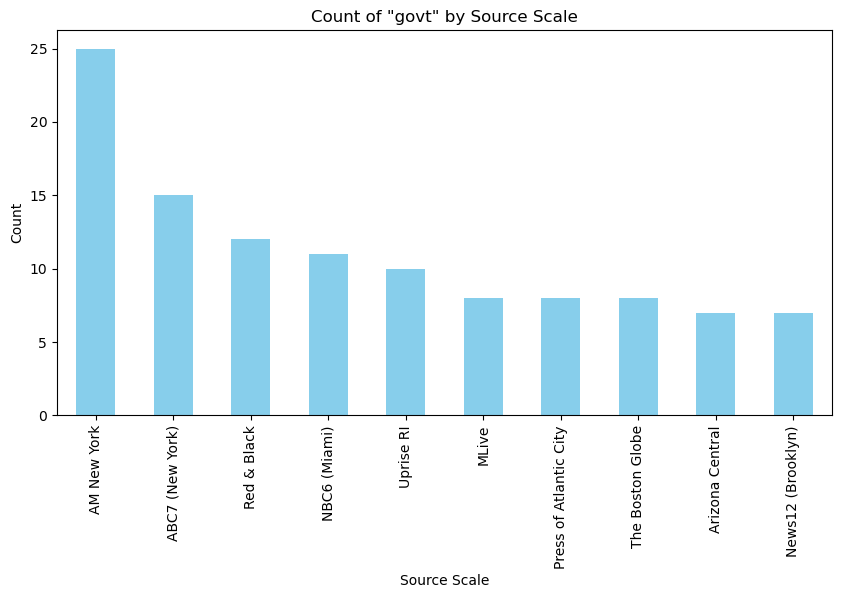

In [57]:
govt_source_counts = govt_data['source'].value_counts()
govt_source_count_10 = govt_source_counts[:10]

plt.figure(figsize=(10, 5))
govt_source_count_10.plot(kind='bar', color='skyblue')
plt.title('Count of "govt" by Source Scale')
plt.xlabel('Source Scale')
plt.ylabel('Count')
plt.xticks(rotation=90)
plt.show()

In [58]:
fig = px.scatter_mapbox(govt_data, lat="latitude", lon="longitude", hover_name="location", zoom=3, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(title='Map of "Government of the United States" Instances', margin={"r":0,"t":30,"l":0,"b":0})
fig.show()

## Map

The map shows high-density clusters of protests in major urban areas such as the East and West Coasts, particularly around cities like Los Angeles, New York, and Washington D.C. This is consistent with population density and the presence of institutional structures that are often the focus of demonstrations.

In [59]:
blm_data['assoc_actor'] = 'BLM'
students_data['assoc_actor'] = 'Students'
labour_group_data['assoc_actor'] = 'Labour Group'
women_data['assoc_actor'] = 'Women'
govt_data['assoc_actor'] = 'Government'

# Combining all the maps gathered from the previous data to visualize them at the same glance
# to undestand and discern the differences between the top 5 associated actors

combined_data = pd.concat([blm_data, students_data, labour_group_data, women_data, govt_data])


fig = px.scatter_mapbox(combined_data, lat="latitude", lon="longitude",
                        color="assoc_actor", hover_name="location",
                        zoom=3, height=500, title='Combined Map of Various Associated Actors ')

fig.update_layout(mapbox_style="open-street-map",
                  mapbox_zoom=3,
                  mapbox_center={"lat": 37.0902, "lon": -95.7129},
                  margin={"r":0,"t":0,"l":0,"b":0},
                  legend_title_text='assoc_actor')

fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\812147166.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\812147166.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\812147166.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs

# Year on Year Analysis

## 2020

In [60]:
df_filtered = df[df['event_date'].dt.year == 2020] #filtering our for the year 2020

df_filtered['year_month'] = df_filtered['event_date'].dt.strftime('%Y-%m')
#For a month-year value taking the Y/m from the datetype converted event_date

monthly_protest_counts = df_filtered.groupby(['year_month', 'event_type']).size().to_frame(name='protest_count').reset_index()
#grouping by year_month to get the protest counts per month by the event_type color

fig = px.bar(monthly_protest_counts, x='year_month', y='protest_count', color = 'event_type',
             title='Monthly Protest Count in 2020',
             labels={'year_month': 'Year-Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\1430075707.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Top 3 months are May > August > July. Lets explore them further.

In [61]:
df_filtered_riot = df_filtered[df_filtered['event_type'] == 'Riots']
df_filtered_protests = df_filtered[df_filtered['event_type'] == 'Protests']

In [62]:
df_filtered_riot_day = df_filtered_riot.groupby('event_date')['event_type'].count().reset_index(name='riot_count')
fig = px.bar(df_filtered_riot_day, x='event_date', y='riot_count', title='Daily Riot Count in 2020')
#Daily Riot count for the year 2020
fig.show()

In [63]:
df_filtered_protests_day = df_filtered_protests.groupby('event_date')['event_type'].count().reset_index(name='protest_count')
fig = px.bar(df_filtered_protests_day, x='event_date', y='protest_count', title='Daily Protest Count in 2020')
#Daily protest count for the year 2020
fig.show()

In [64]:
df = pd.read_csv("North_America-United_States.csv")
df["event_date"] = pd.to_datetime(df["event_date"])

filtered_df = df[(df['year'] == 2020) &
                        (df['event_type'] == 'Riots')]
#Selecting a subset of only the Riots in 2020

fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}],
                                           [{'type': 'domain'}, {'type': 'domain'}]],
                    subplot_titles=('May 2020', 'June 2020', 'July 2020', 'August 2020'))

months = ['May', 'June', 'July', 'August']
subplot_positions = [(1, 1), (1, 2), (2, 1), (2, 2)]

for month, position in zip(months, subplot_positions):

    month_df = filtered_df[filtered_df['event_date'].dt.strftime('%B') == month]

    assoc_actor_counts = month_df['assoc_actor_1'].str.split(';').explode().value_counts()
#the associated actors in many rows are seperated by ';'. Dealing with that to get the accurate value counts
#of the associated actors.

    top_contributors = assoc_actor_counts.head(5)

    labels = top_contributors.index
    values = top_contributors.values

    fig.add_trace(go.Pie(labels=labels, values=values, name=month), row=position[0], col=position[1])

fig.update_layout(
    title=dict(text='Top 5 Contributors in Associated Actors for Riots (May-Aug 2020)', x=0.5),
    font=dict(size=12),
    width=800,
    height=600
)

fig.show()

In [65]:
filtered_df = df[(df['year'] == 2020) &
                        (df['event_type'] == 'Protests')]
#Selecting a subset of only the Protests in 2020

fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}],
                                           [{'type': 'domain'}, {'type': 'domain'}]],
                    subplot_titles=('May 2020', 'June 2020', 'July 2020', 'August 2020'))
#Creating subplot for easy visibility

months = ['May', 'June', 'July', 'August']
subplot_positions = [(1, 1), (1, 2), (2, 1), (2, 2)]

for month, position in zip(months, subplot_positions):
    month_df = filtered_df[filtered_df['event_date'].dt.strftime('%B') == month]

    assoc_actor_counts = month_df['assoc_actor_1'].str.split(';').explode().value_counts()
#the associated actors in many rows are seperated by ';'. Dealing with that to get the accurate value counts
#of the associated actors.

    top_contributors = assoc_actor_counts.head(5)

    labels = top_contributors.index
    values = top_contributors.values

    fig.add_trace(go.Pie(labels=labels, values=values, name=month), row=position[0], col=position[1])

fig.update_layout(
    title=dict(text='Top 5 Contributors in Associated Actors for Protests (May-Aug 2020)', x=0.5),
    font=dict(size=12),
    width=800,
    height=600
)

fig.show()

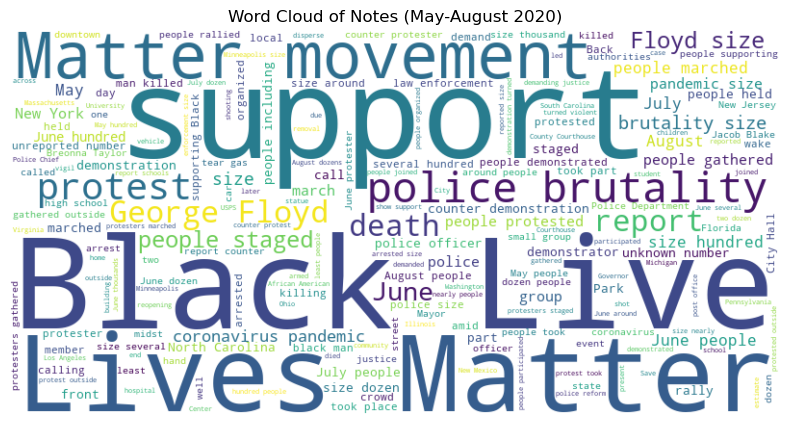

In [66]:
filtered_df = df[(df['event_date'].dt.year == 2020) &
                 (df['event_date'].dt.month.isin([5, 6, 7, 8]))]
#Choosing the months when there was a peak in activity in 2020

notes = ' '.join(filtered_df['notes'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Notes (May-August 2020)')
plt.show()

## 2021

In [67]:
df_filtered = df[df['event_date'].dt.year == 2021]

df_filtered['year_month'] = df_filtered['event_date'].dt.strftime('%Y-%m')

monthly_protest_counts = df_filtered.groupby(['year_month', 'event_type']).size().to_frame(name='protest_count').reset_index()
#Like we previously did, getting the event_count for each month in 2021 coloured by event_type

fig = px.bar(monthly_protest_counts, x='year_month', y='protest_count', color = 'event_type',
             title='Monthly Protest Count in 2021',
             labels={'year_month': 'Year-Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\2835233933.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Top 3 months are May > August > July. Lets explore them further.

In [68]:
df_filtered_riot = df_filtered[df_filtered['event_type'] == 'Riots']
df_filtered_protests = df_filtered[df_filtered['event_type'] == 'Protests']

In [69]:
df_filtered_riot_day = df_filtered_riot.groupby('event_date')['event_type'].count().reset_index(name='riot_count')
fig = px.bar(df_filtered_riot_day, x='event_date', y='riot_count', title='Daily Riot Count in 2021')
#Daily Riot count in the year 2021
fig.show()

In [70]:
df_filtered_protests_day = df_filtered_protests.groupby('event_date')['event_type'].count().reset_index(name='protest_count')
fig = px.bar(df_filtered_protests_day, x='event_date', y='protest_count', title='Daily Protest Count in 2021')
# Daily protest count in the year 2021
fig.show()

In [71]:
filtered_df = df[(df['year'] == 2021) &
                        (df['event_type'] == 'Protests')]

fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}],
                                           [{'type': 'domain'}, {'type': 'domain'}]],
                    subplot_titles=('January 2021', 'March 2021', 'May 2021', 'October 2021'))

months = ['January', 'March', 'May', 'October']
subplot_positions = [(1, 1), (1, 2), (2, 1), (2, 2)]

for month, position in zip(months, subplot_positions):
    month_df = filtered_df[filtered_df['event_date'].dt.strftime('%B') == month]

    assoc_actor_counts = month_df['assoc_actor_1'].str.split(';').explode().value_counts()
    #similarly as above instances splitting and getting the counts for the associated actors

    top_contributors = assoc_actor_counts.head(5)

    labels = top_contributors.index
    values = top_contributors.values

    fig.add_trace(go.Pie(labels=labels, values=values, name=month), row=position[0], col=position[1])

fig.update_layout(
    title=dict(text='Top 5 Contributors in Associated Actors for Protests (January, March, May, Oct 2021)', x=0.5),
    font=dict(size=12),
    width=800,
    height=600
)

fig.show()

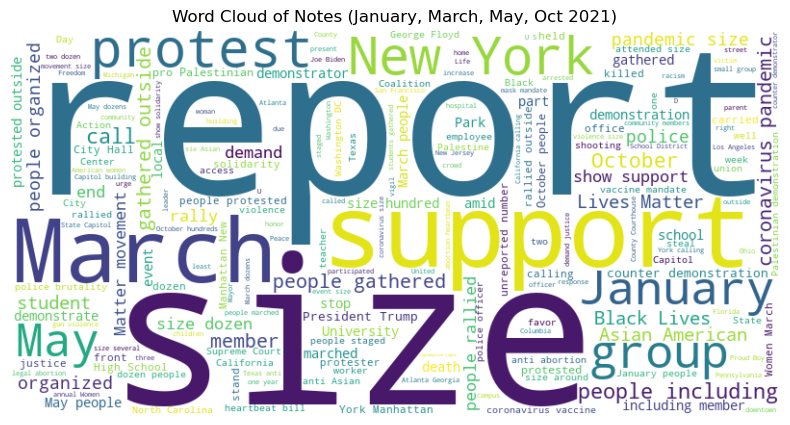

In [72]:
filtered_df = df[(df['event_date'].dt.year == 2021) &
                 (df['event_date'].dt.month.isin([1, 3, 5, 10]))]#selecting the months which showed peak in activity

notes = ' '.join(filtered_df['notes'].dropna())#combining information from the notes for wordcloud

wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Notes (January, March, May, Oct 2021)')
plt.show()

## 2022

In [73]:
df_filtered = df[df['event_date'].dt.year == 2022] # selecting only the year 2022

df_filtered['year_month'] = df_filtered['event_date'].dt.strftime('%Y-%m') #Creating a year-month for understanding

monthly_protest_counts = df_filtered.groupby(['year_month', 'event_type']).size().to_frame(name='protest_count').reset_index()
#getting the count of protests per month in the year 2022

fig = px.bar(monthly_protest_counts, x='year_month', y='protest_count', color = 'event_type',
             title='Monthly Protest Count in 2022',
             labels={'year_month': 'Year-Month', 'protest_count': 'Number of Protests'})
fig.update_xaxes(tickangle=-45)
fig.show()

C:\Users\ashwi\AppData\Local\Temp\ipykernel_9088\2695222818.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Top 3 months are May > August > July. Lets explore them further.

In [74]:
df_filtered_riot = df_filtered[df_filtered['event_type'] == 'Riots']
df_filtered_protests = df_filtered[df_filtered['event_type'] == 'Protests']


sub_event_counts = df_filtered_protests['sub_event_type'].value_counts().reset_index()
sub_event_counts.columns = ['sub_event_type', 'count'] # Getting the Sub_event_types and their counts.
fig = px.pie(sub_event_counts, names="sub_event_type", values="count",hole = 0.3, title="Count of Protests Sub Event types")
fig.show()

# contribution of sub_event type for the year 2022.

In [75]:
df_filtered_riot_day = df_filtered_riot.groupby('event_date')['event_type'].count().reset_index(name='riot_count')
fig = px.bar(df_filtered_riot_day, x='event_date', y='riot_count', title='Daily Riot Count in 2022')
#Daily riot count in 2022 to see and analyze , time of the year for the spikes
fig.show()

In [76]:
df_filtered_protests_day = df_filtered_protests.groupby('event_date')['event_type'].count().reset_index(name='protest_count')
fig = px.bar(df_filtered_protests_day, x='event_date', y='protest_count', title='Daily Protest Count in 2022')
#Daily Protest count in 2022 to see and analyze , time of the year for the spikes
fig.show()

In [77]:
filtered_df = df[(df['year'] == 2022) &
                        (df['event_type'] == 'Protests')]

# we are filtering out all the protest instances in 2022, to understand the Associated actors at play.

fig = make_subplots(rows=2, cols=2, specs=[[{'type': 'domain'}, {'type': 'domain'}],
                                           [{'type': 'domain'}, {'type': 'domain'}]],
                    subplot_titles=('January 2022', 'March 2022', 'May 2022', 'June 2022'))

months = ['January', 'March', 'May', 'June']
subplot_positions = [(1, 1), (1, 2), (2, 1), (2, 2)]

for month, position in zip(months, subplot_positions):

    month_df = filtered_df[filtered_df['event_date'].dt.strftime('%B') == month]

    assoc_actor_counts = month_df['assoc_actor_1'].str.split(';').explode().value_counts()

    top_contributors = assoc_actor_counts.head(5)

# Through this for loop we are considering 1 month at a time, dealing with the associated actors appropriately
# Using that we are getting the Associated actor counts for the top 4 months

    labels = top_contributors.index
    values = top_contributors.values

    fig.add_trace(go.Pie(labels=labels, values=values, name=month), row=position[0], col=position[1])

fig.update_layout(
    title=dict(text='Top 5 Contributors in Associated Actors for Protests (January, March, May, Jun 2022)', x=0.5),
    font=dict(size=12),
    width=800,
    height=600
)

fig.show()

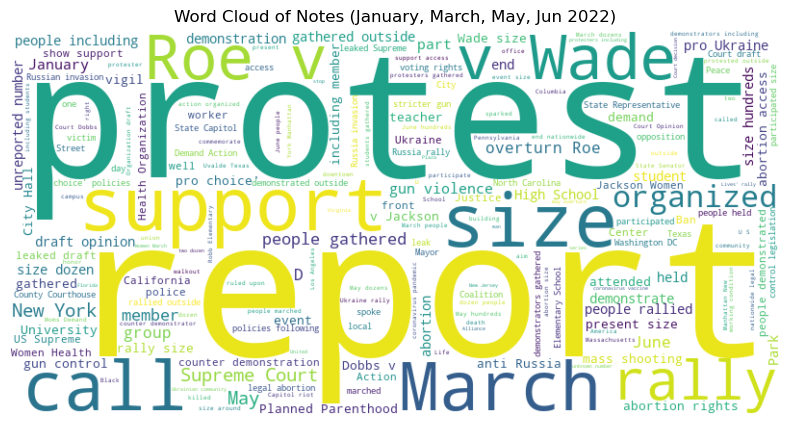

In [78]:
filtered_df = df[(df['event_date'].dt.year == 2022) &
                 (df['event_date'].dt.month.isin([1, 3, 5, 6]))]

# Like we have done previously, we are generating a word clound for the top 4 peak months in the year 2022

notes = ' '.join(filtered_df['notes'].dropna())

wordcloud = WordCloud(width=800, height=400, background_color ='white').generate(notes)

plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.title('Word Cloud of Notes (January, March, May, Jun 2022)')
plt.show()

# Per Section Analysis

## Pre-processing and EDA

- Based on Actor 1 removed all the rows that had protests and riots outside of the united states.

- Most of the data in the dataset as we can see from the pie chart comes from 2020. We can further delve deep into understanding:
    - Why majority of it is from 2020
    - What could be contributing to it

- From the previous plot we have observed that majority of the data comes from 2020. This bar corroborates that idea.
	- Top 5 number of protests that occurred across 2020 - 2022 came during the months May - Sept of 2020.

- We can see that overall protests have been higher compared to riots. So by definition of the data, there has been less violent outbreaks. It will be interesting to see the breakup for specific groups.

- In line with the previous graph, we can see that most of the Sub events are Peaceful Protests. This also explains the majority of it being protests.

- Compared to United States the we can see that the information at our disposal regarding Protests and Riots outside of the United States is limited. In this scenario as the data is very skewed it might not give an accurate representation of the international data. Those should be dealt with while continuing the analysis.

- Seeing the Top 50 gives a very broad and unimportant overview of the entire feature. By zooming in to the top 5, it can provide a snapshot into the analysis as they do explain a large chunk of the Associated actors. And the Top 5 seem to be:

	(BLM: Black Lives Matter, Students, Labour Group, Women, Government of the United States, African American Group)

- As we saw for Actor1, it is the same case here where most of the data is skewed by the United States and the rest are very less. This can also be dealt with accordingly.

- By Analyzing the Actor1; Assoc Actor 1 - Actor 2; Assoc Actor2. We can try to determine some interesting insights into their relation.

- At this stage this is fairly unimportant as we do not have more information on the codes and their meaning and as 90% + are skewed in favour of the Interaction code 60 - We can avoid this for analysis.

- Here we can see that most of the States in questions are the states with large cities with large populations. Most of the population centers in the United States and the modern working public are located here, it makes sense that the top 10 here would be ideally the top 10 most populated and popular states in the Untied States.

	- It might be an interesting correlation to see the event sub_type to the state.

- Majority of the information is sourced from Three sources:
    
    - Crowd Counting Consortium
    - Count Love
    - Twitter
	- Not a lot of the data has been gathered from traditional media channels, this can speak to the quality of the data and the non legacy channel access to data available in this day and age.


## BLM


### Heatmap of Yearly Count by Sub-Event Type

The heatmap provides a count of BLM-related protests across different categories of protest intensity:

- **Dominance of Peaceful Protests**: Each year, the overwhelming majority of BLM protests were peaceful, with a peak in 2021. This suggests a surge in activism possibly related to high-profile incidents or trials.
- **Protests with Intervention and Violence**: While significantly lower than peaceful protests, interventions and violent demonstrations were present each year, indicating some confrontations with law enforcement or escalations.
- **Decrease in Peaceful Protests in 2022**: There’s a noticeable reduction in peaceful protests from 2021 to 2022. This could imply a de-escalation of tensions, the impact of policy changes, or a shift in the public's engagement tactics.

### Bar Chart of Monthly Protest Count Per State

This visualization shows BLM protest counts by month and state, highlighting:

- **Variation Across States**: Some states, like California, exhibit higher counts, which could be linked to larger populations, higher rates of police-citizen encounters, or more active local chapters of BLM.
- **Peaks at Specific Times**: There are peaks in certain months, notably in the summer months across several states, which aligns with historical patterns of increased social activism during warmer months and possibly in response to specific incidents.

### Word Cloud for "BLM: Black Lives Matter" in Assoc_actor_1

The word cloud indicates frequently occurring words in relation to BLM protests, giving insight into the context and issues:

- **Central Issues and Terms**: Words such as "police," "brutality," "George Floyd," and "rally" are prominent, signaling the core issues around which the BLM movement is galvanized.
- **Movement's Extent**: The sizeable representation of "movement," "protest," and "support" indicates widespread participation and the national scope of BLM-related activism.

### Bar Chart of Protest Count by Source Scale

The bar chart detailing the count of BLM-related protests by media sources suggests:

- **Social Media's Role**: Platforms like Twitter play a major role in spreading information about BLM protests, serving as a space for mobilization and discussion.
- **Media Attention**: The distribution of reports across various news outlets suggests that BLM protests have received substantial media coverage, influencing public discourse.

### Map of "Black Lives Matter" Instances

The map displays the geographical spread of BLM-related protests across the United States:

- **Nationwide Spread**: The protests are widespread, which emphasizes that BLM is a national movement, with incidents reported in both urban and rural areas.
- **Concentration in Urban Centers**: Higher concentrations in cities might reflect the larger African American populations, urban tensions, and the presence of activist networks in these areas.

## Students

The bar chart represents the count of student-related protests as reported by different news sources or platforms. Upon closer examination, we can observe:

1. **Media Engagement**: The leading source, Red & Black, has the highest count, which suggests that this source is particularly engaged in student affairs or located in a region with high protest activity. If this source is affiliated with a university or a student body, it may imply that it is a primary outlet for student voices and issues.
    
2. **Variability Among Outlets**: There is a distribution of counts among sources, with some like MLive, Fight Back News, and Indybay following closely behind. This could indicate regional reporting tendencies or different outlets focusing on different aspects of student activism.
    
3. **Platform Types**: The presence of Twitter suggests that social media is also a significant platform for reporting or discussing student protests. It highlights the importance of social media in mobilizing, organizing, or spreading awareness about student protests.


By examining the source of the reports, stakeholders can better understand where to look for information about student protests and how different media perceptions might influence public understanding.

### Geographical Distribution Map

The geographical distribution map plots the locations of student protests across the United States. This map reveals several key patterns:

1. **Density in Urban and Coastal Areas**: There's a clear density of protests in urban areas and along the coasts, particularly the East and West Coasts. These areas typically host large universities and colleges with significant student populations.
    
2. **Hotspots of Activism**: Certain states like California, New York, and others along the coastlines show high concentrations of protests. This could correlate with political activism, student population size, and social issues prevalent in these states.
    
3. **Midwest and Rural Representation**: While the coastal areas are more densely populated with protest activity, there's still a fair representation in the Midwest and some rural areas. The nature of these protests may differ and could be influenced by local or state issues pertinent to the student bodies in these regions.
    
4. **Regional Issues**: The map indicates that student protests are not isolated to any one area, suggesting a variety of issues motivate these protests, possibly reflecting regional concerns like local government policies, state educational reforms, or region-specific social issues.
    
5. **Access to Education and Diversity**: The widespread distribution also suggests that access to higher education and the diversity of student bodies are nationwide phenomena, and thus, the potential for student activism is not limited by geography.
    
6. **Influence of Institutions**: Institutions located in these hotspots likely play a significant role in nurturing a culture of activism. The map could be cross-referenced with locations of major universities to understand the influence of institutional culture on protest activity.
    
7. **Infrastructure for Protest**: Urban areas, especially those with higher education institutions, may provide the necessary infrastructure—such as public spaces and organizational networks—that facilitates protests.
    

### Heatmap of Yearly Count by Sub-Event Type

The heatmap presents a count of protests by students from 2020 to 2022 categorized by the type of event. Key observations are:

- **Dominance of Peaceful Protests**: The overwhelming majority of student protests are peaceful, indicating a strong inclination towards non-violent forms of expression.
- **Variability in Intervention and Violence**: There is some presence of protests with intervention and violence, but these are significantly fewer in number.
- **Yearly Trends**: There’s a slight decrease in the total number of peaceful protests from 2020 to 2022, which might suggest a trend that warrants further investigation into the causes—be they pandemic-related changes, policy impacts, or shifts in student activism.

### Monthly Protest Count Per State Bar Chart

This stacked bar chart displays the monthly count of student protests across various states. Insights include:

- **State-Specific Activism**: Certain states, like California, show higher levels of student protest activity, possibly reflecting larger student populations or more politically active campuses.
- **Seasonal Patterns**: There are evident seasonal patterns, with some months showing increased activity, which could correlate with academic calendars, significant political events, or national issues.
- **Diversity of Causes**: The color-coding by month may suggest the reasons for protests are diverse and could be influenced by seasonal factors or events specific to the time of year.

### Word Cloud of Associated Actors

The word cloud visualizes the most frequently occurring words in the context of student protests. The largest words offer the most salient insights:

- **Central Themes**: "Support," "Black Lives Matter," "Students," "University," and "High School" are prominent, highlighting key issues such as racial justice and educational institutions as focal points for student activism.
- **Pandemic Impact**: References to "pandemic" and "coronavirus" suggest that COVID-19 has been a significant factor in student protests.
- **Educational Focus**: The prominence of "University" and "School" indicates that much of the student activism is centered around educational settings.

### Bar Chart of Protest Count by Source

The bar chart showcases the number of protests reported by various news sources. This indicates:

- **Media Attention**: Some sources report on student protests more frequently than others, which could reflect their audience or editorial focus.
- **Reliability of Sources**: Sources that frequently report on protests might be seen as more reliable for information on student activism, or they might have a closer connection to these events.

### Geographical Distribution Map

The map illustrates the geographical spread of student protests across the United States. Observations include:

- **Nationwide Distribution**: Student protests occur nationwide, indicating a widespread culture of student activism.
- **Concentration in Urban Areas**: Higher concentrations of protests in urban areas may reflect larger student populations or more active social issues in these regions.
- **Regional Hotspots**: Certain regions appear to have higher protest counts, warranting a closer look at regional issues affecting students.

## Labour Group

### Heatmap of Yearly Count by Sub-Event Type

The heatmap illustrates the count of different types of labor-related protests from 2020 to 2022. Key insights are:

- **Prevalence of Peaceful Protests**: Across all three years, peaceful protests are the most common form of labor group demonstration. There's a notable peak in 2021, which could be related to specific labor movements or responses to policies.
- **Variation Over Years**: There's a decrease in peaceful protests in 2022, suggesting a potential change in the labor landscape, possibly due to resolution of disputes or shifts in the economic or political environment.
- **Incidence of Other Protest Types**: While peaceful protests dominate, there are occurrences of protests with intervention and violent demonstrations, though they are significantly less frequent. A slight increase in protests with intervention from 2020 to 2021 could indicate growing tensions or changes in law enforcement responses.
- **Excessive Force Against Protesters**: This category is nearly absent, but its presence in 2021 could point to isolated incidents that warrant closer examination for context and implications.

### Bar Chart of Monthly Protest Count Per State

This visualization breaks down the monthly protest counts across different states, and several trends can be identified:

- **State-Specific Trends**: California shows a significant amount of protest activity, suggesting strong labor movements or a large workforce advocating for labor rights.
- **Seasonal Patterns**: The presence of monthly colors indicates that certain times of the year may see more labor-related activity, which could be aligned with industry-specific cycles, contract renewal periods, or national policy changes affecting workers.
- **Regional Differences**: There's variability in protest counts across states, reflecting the diverse industrial landscapes and differing state labor laws.

### Word Cloud for Labour Group

The word cloud for "Labour Group" provides insights into the most frequent terms associated with these protests:

- **Pandemic Influence**: The sizeable presence of terms like "pandemic," "coronavirus," and "vaccine" suggests that COVID-19 and its implications have been a significant factor in labor group protests.
- **Location Specificity**: "New York," "Los Angeles," and "San Francisco" are prominently featured, indicating these cities as hotspots for labor activism.
- **Key Issues**: Words like "demand," "strike," and "support" reflect common themes in labor protests, pointing to demands for better conditions, support for strikes, and solidarity among workers.

### Bar Chart of Protest Count by Source Scale

This bar chart measures the number of protests reported by different sources or scales:

- **Social Media Influence**: Twitter dominates as a source, indicating its importance as a platform for disseminating information about labor protests and for organizing.
- **Local Union Reporting**: The presence of specific unions (e.g., UNITE HERE Local 11) in the reporting suggests that labor unions are not only active in protests but also in reporting these events.
- **Media Coverage**: Various news outlets and associations are represented, indicating an interest in labor issues across different types of media.

### Map of "Labour Group" Instances

The geographical map shows the spread of labor group protests across the United States:

- **Nationwide Spread**: Demonstrations are widespread, indicating that labor issues affect a wide geographic area and are not limited to traditional industrial regions.
- **Urban Centers and Coastal Areas**: There's a concentration of protests in urban and coastal areas, aligning with larger populations and major centers of industry and commerce.
- **Rural Representation**: While less dense, there is still a presence of labor protests in more rural areas, which could be connected to agricultural or manufacturing sectors.

## Women

- *Growing Momentum*: The escalation in peaceful protests indicates increasing engagement in women's issues over the observed period, reflecting a heightened national dialogue around these topics.
- *Legal and Rights-Focused Protests*: The word cloud and heatmap point towards a focus on legal battles, particularly around reproductive rights and the role of the Supreme Court.
- *Role of Social Media and Media Outlets*: Media, especially social media, plays a critical role in amplifying women's voices and protest activities, acting as both a tool for organization and a measure of protest visibility and reach.
- *Regional Patterns of Mobilization*: The geographical map and monthly counts by state highlight regions with higher mobilization, which could be driven by local issues, policy decisions, and the presence of advocacy groups.



## Assoc_actor 1 and Assoc_actor_2 pair analysis

1. The most frequent actor pair is "(BLM: Black Lives Matter, Pro-Police Group (United States))" with a frequency of 173. This suggests a significant number of interactions or co-occurrences between the Black Lives Matter movement and pro-police groups in the United States.

2. The second most frequent pair is "((Pro-Police Group (United States), BLM: Black Lives Matter)" with a frequency of 105. This pair is similar to the top pair but with a different order, indicating that the dataset captures interactions in both directions.

3. Other prominent pairs include various combinations of Black Lives Matter, Back the Blue, Civilians, Proud Boys, Antifa, Students, Women, Christian Groups, and Journalists. This diversity of actor pairs suggests a complex network of interactions among different social, political, and ideological groups.

4. The presence of "Back the Blue" and "Pro-Police Group" in multiple pairs highlights the significant role of police-related groups in the protest landscape.

5. The inclusion of "Students," "Women," and "Christian Group" in the top pairs indicates the involvement of these demographic and religious groups in the protest events.

Top 20 Most Frequent Actor Pairs

1. The chart clearly shows the dominance of pairs involving the Black Lives Matter movement and pro-police groups, with "BLM: Black Lives Matter & Pro-Police Group (United States)" being the most frequent pair by a significant margin.

2. The chart also highlights the frequent co-occurrence of "Back the Blue" and "BLM: Black Lives Matter," suggesting a strong interaction between these two groups.

3. Pairs involving "Proud Boys," "Antifa," "Students," and "Women" are also prominent, indicating their active involvement in the protest events.

4. The presence of "Government of the United States (2017-2021)" in the top pairs suggests the involvement of the government as an actor in the protest landscape.

5. The chart also includes pairs with "Journalists," "Sole Perpetrator," "Police Forces of the United States," and "Unidentified Communal Militia," highlighting the diversity of actors involved in the protests.


Checking the frequency of the interaction codes apart from 60 which is just for sole protestors, we can see and understand at the actor level the association between them. Clubbing these with the insights gathered previously can show some interesting information. 

## Govt USA

### Heatmap of Yearly Count by Sub-Event Type

This heatmap presents the count of various government-related protests from 2020 to 2022, across different levels of confrontation:

- **Consistent Peaceful Protests**: There's a consistent number of peaceful protests with a notable peak in 2021, indicating a possible response to particular political events or policies introduced in that year.
- **Protests with Intervention**: These are significantly lower compared to peaceful protests, but there's a presence each year, showing that some protests led to clashes or required intervention from authorities.
- **Violent Demonstrations**: While the least frequent, violent demonstrations occur each year, signifying intense confrontations on a smaller scale, potentially around highly contentious issues.

### Bar Chart of Monthly Protest Count Per State

This bar chart breaks down the protest counts by month and state, giving a view into the temporal and geographical distribution of these events:

- **Higher Activity in Certain Months**: Peaks in certain months might correlate with political cycles, such as elections, legislative sessions, or significant policy announcements.
- **State-Specific Protests**: Some states show higher counts, possibly reflecting localized issues or a stronger tradition of civic engagement in response to governmental actions.
- **Variability Across the Country**: The spread of protests across many states suggests that a range of issues are motivating citizens to engage in protest activities.

### Word Cloud for "Govt" in Assoc_actor_1

The word cloud highlights frequently occurring terms related to government-related protests:

- **Dominant Themes**: Words like "protest," "government," "rally," and "New York" stand out, indicating common themes and significant locations for protests.
- **Prominent Issues**: References to "Black Lives Matter," "police," and "Roe v Wade" suggest that social justice issues and reproductive rights are among the catalysts for protest.
- **Organizational and Movement Keywords**: The use of words like "organized," "march," and "rally" suggests a high degree of organization within these protests.

### Bar Chart of Protest Count by Source Scale

This bar chart depicts the count of government-related protest reports by different news sources and scales:

- **Primary Reporting Sources**: Some sources are more prominent, which could reflect their editorial focus or geographical proximity to significant protest events.
- **Role of Local News**: Local news sources like "Red & Black" and regional sources appear to play an important role in covering government-related protests, highlighting the importance of local journalism in civil engagement.

### Map of "Government of the United States" Instances

The geographical map shows the spread of government-related protests across the country:

- **Nationwide Distribution**: There's a clear indication that government-related issues are causing protests across the entire nation, not just in political centers.
- **Concentration in Urban Areas**: Larger dots in urban areas suggest higher instances of protest, likely due to population density and the concentration of governmental functions.


## Map

### Geographic Distribution and Density

**High-Density Areas:** The map shows high-density clusters of protests in major urban areas such as the East and West Coasts, particularly around cities like Los Angeles, New York, and Washington D.C. This is consistent with population density and the presence of institutional structures that are often the focus of demonstrations.

**BLM Protests:** The BLM protests are widespread but show significant concentrations in urban areas, reflecting the national conversation on racial justice and the reaction to incidents of police brutality. Their presence across the map indicates the extensive reach of the movement.

**Student Protests:** The distribution of student protests correlates with locations of major universities and colleges, with a noticeable presence in college towns across the country. The pattern suggests a youth-led movement deeply rooted in educational institutions.

**Labour Group Protests:** These protests are spread out but appear more concentrated in areas with a history of labor union activity and industrial centers. They are not as densely clustered as BLM protests, indicating more localized issues driving labor demonstrations.

**Women's Protests:** The protests related to women’s issues, which are likely to involve reproductive rights and gender equality, also appear in both urban and rural areas but are particularly prominent in regions where such issues are highly legislated or debated.

**Government Protests:** These are broadly distributed, highlighting the omnipresence of civic engagement and the propensity of citizens to assemble in response to political actions, policy changes, and governmental decisions.

### Intensity and Overlaps

**Intensity:** BLM protests, given their genesis in response to acute and highly publicized incidents, may carry an intensity reflected in the clusters on the map. Where BLM protests are dense, it might indicate a strong community response to racial justice issues.

**Interconnected Movements:** There's potential overlap in areas where multiple colors converge on the map. For example, student and BLM protests may intersect on issues of campus policing, while labor and government protests might converge over public sector working conditions.

**Seasonal and Temporal Factors:** Certain areas may show cyclical patterns of protests related to specific times of the year, such as Women's History Month or Labor Day, which are not immediately apparent on the map but important for nuanced understanding.

**Socio-Political Context:** The overlay of different protest types indicates that some regions are hotbeds for multiple forms of activism, possibly reflecting a vibrant socio-political culture that encourages public demonstration across a spectrum of issues.

### Inferences and Implications

**Broader Social Movements:** The coalescence of various protest types suggests broader social movements and coalitions forming around shared goals or in opposition to common challenges.

**Public Policy Response:** Dense areas of protest activity might be indicative of regions where public policy is not aligned with the populace's demands or where political tension is most palpable.

**Resource Allocation for Civic Management:** Law enforcement and public safety officials could use this map to allocate resources more effectively, ensuring peaceful protests can occur without undue escalation.

**Media Coverage and Public Perception:** The map also has implications for media coverage, as journalists might focus on areas with high protest density, potentially skewing public perception of the ubiquity or intensity of these issues.


## 2020

### Monthly Protest Count in 2020

This bar chart tracks the number of protests (blue) and riots (red) per month throughout 2020. The most prominent feature is the large peak in June, which likely corresponds to events triggered by a significant occurrence, possibly the George Floyd incident leading to worldwide Black Lives Matter protests. There are smaller, yet notable, amounts of protests and riots in the other months, suggesting a year of continued civil unrest. The presence of red in the bars indicates that some protests each month escalated into riots, with June having the highest count of such events.

### Daily Riot Count in 2020

This line graph shows the number of riots each day in 2020. The most striking feature is the spike on May 31st, indicating a day of particularly intense rioting, potentially aligned with the peak observed in the monthly count. The rest of the year shows a baseline level of rioting activity with some smaller spikes, suggesting intermittent periods of escalated tension.

### Daily Protest Count in 2020

Similar to the riot graph, this line graph details daily protests. The peak on June 6th aligns with the surge in the monthly data and confirms a period of heightened protest activity, possibly in response to the same event that triggered the riots. The frequency and intensity of protests seem to decline as the year progresses but remain present, indicating ongoing societal issues or responses to events.

### Top 5 Contributors in Associated Actors for Riots (May-August 2020)

This series of pie charts shows the proportion of different groups involved in riots from May to August 2020. In May, a vast majority is attributed to BLM, with a much smaller percentage to other groups. This dominance decreases slightly over the following months but remains the majority. This data suggests that the BLM movement was the main driver of riots during this period, likely in response to incidents of police brutality and racial injustice.

### Top 5 Contributors in Associated Actors for Protests (May-August 2020)

This set of pie charts categorizes the primary contributors to protests during the same period. The BLM movement again dominates in May and June but decreases over July and August. Notably, in August, the proportions are more evenly spread among different actors, suggesting diversification of protest motivations over time.

### Word Cloud of Notes (May-August 2020)

The word cloud visually emphasizes the most frequently used words in notes related to the events. Words like "protest," "police," "movement," "George Floyd," and "BLM" are prominent, indicating their significance in the narrative of 2020's protests and riots. The size of the words "pandemic" and "coronavirus" reflect the backdrop of COVID-19 during these events.

### Overall Analysis

The data illustrates a year of significant civil unrest, with the BLM movement being a major contributor to protests and riots, particularly in the middle of the year. The impact of the George Floyd incident is seen with spikes in activity and the prevalence of related terms in communications. The persistent level of activity throughout the year suggests a broad range of issues sparking public action, not limited to but heavily influenced by racial tensions and the response to police actions.

Insights drawn from these visualizations could inform understanding of civil movement patterns, governmental and societal responses, and the impact of specific events on national stability. These analyses also underscore the influence of broader contexts such as the pandemic on civil unrest dynamics.

## 2021

**Monthly Protest Count in 2021:**
- The bar chart shows protests and riots by month in 2021. The peak of protest activity is in April, with a substantial number of protests compared to riots, suggesting a significant event or series of events prompting civil action.
- The overall trend seems to be more protests than riots, indicating that while civil unrest existed, it was largely peaceful or nonviolent.
- The consistent presence of riots, although small in number, points towards ongoing tensions that occasionally erupted into more confrontational encounters.

**Daily Riot and Protest Count in 2021:**
- Daily counts reveal specific dates with heightened riot or protest activity, which could correspond to significant political or social events. High peaks could indicate responses to trigger events such as court rulings, police actions, or legislative decisions.
- There’s significant variability in the daily protest counts, highlighting how certain days or periods have concentrated activities which could be due to organized national or local movements.

**Top 5 Contributors in Associated Actors for Protests:**
- The pie charts for associated actors show a diverse set of groups involved in the protests. BLM and Student groups are consistently present, indicating their ongoing engagement with the issues at hand.
- The presence of Labor Groups, Teachers, and different ethnic groups like Asian American and African American groups suggest a broad coalition of interests and concerns that are driving the protests.
- The variety in the top contributors by month indicates shifting focuses and alliances in protest movements, reflecting the dynamic nature of socio-political activism.

**Word Cloud of Notes:**
- The word cloud highlights the most prominent terms in notes related to the protests. Words like “support,” “Black Lives Matter,” “police,” “student,” and “Asian American” suggest key issues around racial justice, law enforcement, and student activism.
- The prominence of “May” and specific location names like “New York” might indicate significant events or protests that took place during that time in those areas.



## 2022

1. **Monthly Protest Count in 2022**: The bar chart depicts the number of protests each month, with a notable peak in May. This suggests a significant event or series of events triggered a higher level of civil activity or unrest during that month. It's interesting to note that while there's a substantial number of protests, the accompanying portion of riots is relatively low, indicating that most of these protests did not devolve into riots.

2. **Count of Protests Sub Event types**: The donut chart shows the distribution of protest sub-event types, overwhelmingly dominated by peaceful protests. A very small fraction represents protests with interventions and even fewer instances of excessive force against protesters. This suggests that while there were many protests, they were largely non-violent, and only a small fraction faced intervention, with even fewer resulting in excessive force.

3. **Word Cloud of Notes**: The word cloud visualizes the most frequent terms in notes related to protests. Prominent terms like "Roe," "Wade," "Supreme Court," and "gun control" suggest that judicial decisions and legislation are key motivators for protests. The appearance of "Ukraine" and "Russia" could indicate international issues also played a significant role in civil activities.

4. **Top 5 Contributors in Associated Actors for Protests**: The pie charts for January, March, May, and June 2022 show the proportion of actors associated with protests. In May, there is a large section labeled "Women (United States)," which could correlate with the peak in protests that month, perhaps due to Abortion events or strikes. "Government of the United States (2021-)" and "Students (United States)" are consistently present.

5. **Daily Riot Count in 2022**: This visualization shows the number of riots occurring each day. There's variability, but on most days, the number is low. There are a few spikes.

6. **Daily Protest Count in 2022**: The data indicates more frequent protest activity than riots, with significant spikes that could align with major events or announcements, particularly noticeable in late June.

